**Table of contents**<a id='toc0_'></a>    
- [Konwolucyjne sieci neuronowe](#toc1_)    
    - [Utwórz lub wybierz katalog do przechowywania wytrenowanych modeli.](#toc1_1_1_)    
  - [Wprowadzenie do ConvNets](#toc1_2_)    
  - [Zaawansowana sieć ConvNet dla danych MNIST](#toc1_3_)    
  - [Utwórz bardziej rozbudowaną strukturę sieci](#toc1_4_)    
  - [Skompiluj i naucz sieć](#toc1_5_)    
  - [Oceń, porównaj i zrób wykresy uzyskanej dokładności (accuracy) i straty (loss)](#toc1_6_)    
  - [Przykład trenowania i walidacji ConvNet na zbiorze danych CIFAR-10](#toc1_7_)    
    - [Utwórz model dla tego zbioru danych](#toc1_7_1_)    
  - [ZADANIA](#toc1_8_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

<table>
<tr>    
<td style="text-align: center">
<h1>Konwolucyjne sieci neuronowe CNN</h1>
<h2><a href="http://home.agh.edu.pl/~horzyk/index.php">Adrian Horzyk</a></h2>
</td> 
<td>
<img src="http://home.agh.edu.pl/~horzyk/im/AdrianHorzyk49BT140h.png" alt="Adrian Horzyk, Professor" title="Adrian Horzyk, Professor" />        
</td> 
</tr>
</table>
<h3><i>Zapraszam do interaktywnego notebooka, w którym możesz dowiedzieć się, jak działają sieci neuronowe, doświadczysz i sprawdzisz ich działanie na wybranych zbiorach danych i przeprowadzisz własne eksperymenty!</i></h3>

# <a id='toc1_'></a>[Konwolucyjne sieci neuronowe](#toc0_)

stały się bardzo popularne, ponieważ skutecznie radzą sobie z wieloma problemami, szczególnie w przypadku obrazów, które można poprawnie rozpoznać lub sklasyfikować niezależnie od ruchu obiektów w polu widzenia, co było dużym ograniczeniem sieci MLP (tylko warstwy gęste).

Konwolucyjne sieci neuronowe (CNN) mogą hierarchicznie wyodrębniać ważne podwzorce, które służą do definiowania cech wyższego rzędu, które pozwalają gęstym warstwom klasyfikować obrazy wejściowe z większą łatwością i dokładnością.

Teraz spróbujemy wytrenować takie sieci przy użyciu zbioru danych MNIST, aby sprawdzić, czy uda nam się osiągnąć lepszą wydajność i dokładność modeli opartych na CNN w porównaniu z poprzednimi modelami MLP (tylko gęste warstwy).

In [1]:
'''Trains a simple ConvNet on the MNIST dataset. It gets over 99.6% validation accuracy after ~50 epochs
(but there is still a margin for hyperparameter tuning). Training can take an hour or so!'''

# Import libraries
from __future__ import print_function
import numpy as np
import math
from math import ceil
import tensorflow as tf
import os   
import seaborn as sns
import matplotlib.pyplot as plt  # library for plotting math functions
import pandas as pd
import keras   # Import keras framework with various functions, models and structures
from keras.datasets import mnist # gets MNIST dataset from repository
from keras import layers
from keras import models
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from keras import optimizers
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from keras.datasets import mnist
import tensorflow
from tensorflow.keras.utils import to_categorical
from keras import regularizers

# Set parameters for plots
%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

print ("TensorFlow version: " + tf.__version__)
print ("Keras version:" + keras.__version__)

TensorFlow version: 2.8.0
Keras version:2.8.0


### <a id='toc1_1_1_'></a>[Utwórz lub wybierz katalog do przechowywania wytrenowanych modeli.](#toc0_)

In [2]:
# The path to the directory for storing and loading our models
models_dir = '../ml_models'
if not os.path.exists(models_dir):
    os.mkdir(models_dir)
    
# The path to the directory where the dataset are stored
original_dataset_dir = 'dataset/'

In [3]:
# Split the data between train and validation sets. Here we are using only two sets for model training and validation.
(x_train, y_train), (x_val, y_val) = mnist.load_data() # 60000 training and 10000 validating examples

# Number of training and val data
num_train_data = x_train.shape[0]
num_val_data = x_val.shape[0]

# Input image dimensions
img_rows, img_cols = x_train.shape[1], x_train.shape[2]

num_classes = np.size(np.unique(y_train))    # number of unique labels = number of classes of digits: 0, 1, 2, ..., 9
print ('Number of classes: ', num_classes)

## Distribution of the numbers training data of various classes
print ('Distribution of the numbers training data of various classes: ', np.unique(y_train, return_counts=True))

## Distribution of the numbers training data of various classes
print ('Distribution of the numbers validation data of various classes: ', np.unique(y_val, return_counts=True))

Number of classes:  10
Distribution of the numbers training data of various classes:  (array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8), array([5923, 6742, 5958, 6131, 5842, 5421, 5918, 6265, 5851, 5949],
      dtype=int64))
Distribution of the numbers validation data of various classes:  (array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8), array([ 980, 1135, 1032, 1010,  982,  892,  958, 1028,  974, 1009],
      dtype=int64))


Kilka przykładów danych MNIST:

<Figure size 180x180 with 0 Axes>

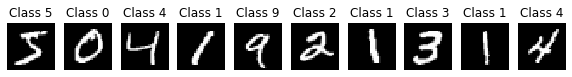

<Figure size 72x72 with 0 Axes>

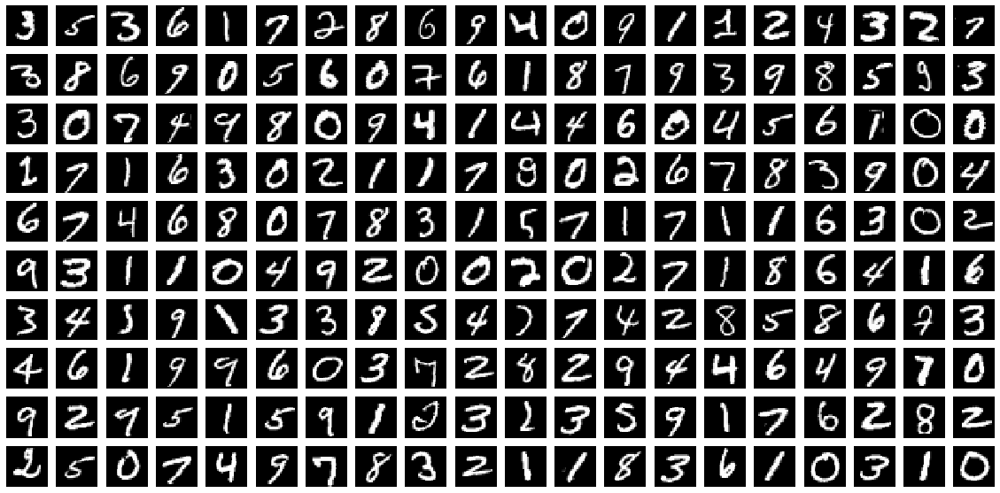

In [4]:
# Show a few sample digits from the training set
plt.figure(figsize=(2.5,2.5))
col1 = 10
row1 = 1
fig = plt.figure(figsize=(col1, row1))
for index in range(0, col1*row1):
    fig.add_subplot(row1, col1, index + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
    plt.title("Class " + str(y_train[index]))
plt.show()

# Show a few sample digits from the training set
plt.figure(figsize=(1.0,1.0))
col2 = 20
row2 = 10
fig = plt.figure(figsize=(col2, row2))
for index in range(col1*row1, col1*row1 + col2*row2):
    fig.add_subplot(row2, col2, index - col1*row1 + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
plt.show()

Zmień kształt (tensora) i przekształć dane do oczekiwanych typów i zakresów:

In [5]:
# According to the different formats reshape training and validation data
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
# Transform training and validating data and show their shapes
x_train = x_train.astype('float32')   # Copy this array and cast it to a specified type
x_val = x_val.astype('float32')     # Copy this array and cast it to a specified type
x_train /= 255   # Transfrom the training data from the range of 0 and 255 to the range of 0 and 1
x_val /= 255    # Transfrom the validation data from the range of 0 and 255 to the range of 0 and 1

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_val.shape[0], 'validation samples')

# Convert class vectors (integers) to binary class matrices using as specific 
y_train = tensorflow.keras.utils.to_categorical(y_train, num_classes) # y_train - a converted class vector into a matrix (integers from 0 to num_classes)
y_val = tensorflow.keras.utils.to_categorical(y_val, num_classes) # y_val - a converted class vector into a matrix (integers from 0 to num_classes)

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 validation samples


## <a id='toc1_2_'></a>[Wprowadzenie do ConvNets](#toc0_)

Najpierw przyjrzyjmy się bardzo prostemu przykładowi convnet. Będziemy używać convnet do klasyfikowania cyfr MNIST, co już wykonałeś, o czym już wspominaliśmy i osiągnęliśmy dokładność walidacji ~ 98%). Chociaż nasza pierwsza sieć będzie bardzo prosta, jej dokładność będzie przewyższać poprzedni model o gęstych połączeniach.

Aby zbudować podstawową sieć komunikacyjną, używamy małego stosu warstw „Conv2D” i „MaxPooling2D”.

Ta sieć przyjmuje jako wejściowe tensory kształtu `(image_height, image_width, image_channels)` (tzn.`(wysokość_obrazu, szerokość_obrazu, kanały_obrazu)`) (nie licząc wymiaru wsadowego). Skonfigurujemy naszą sieć convnet tak, aby przetwarzała dane wejściowe o rozmiarze `(28, 28, 1)` poprzez przekazanie argumentu `input_shape=(28, 28, 1)` do naszej pierwszej warstwy.

In [6]:
# A simple CONVNET model for MNIST data
model1 = models.Sequential()
model1.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_rows, img_cols, 1)))
model1.add(layers.MaxPooling2D((2, 2)))
model1.add(layers.Conv2D(64, (3, 3), activation='relu'))
model1.add(layers.MaxPooling2D((2, 2)))
model1.add(layers.Conv2D(64, (3, 3), activation='relu'))
# Flatten the output to input data to the Dense layer
model1.add(layers.Flatten())
# Dense layers - similar to the previous model, but using the smaller number of units
model1.add(layers.Dense(64, activation='relu'))
model1.add(layers.Dense(num_classes, activation='softmax'))

model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 3, 3, 64)          36928     
                                                                 
 flatten (Flatten)           (None, 576)               0

Można zauważyć, że wynikiem każdej warstwy `Conv2D` i `MaxPooling2D` jest tensor 3D kształtu `(height, width, channels)`, czyli „(wysokość, szerokość, kanały)”. Wymiary szerokości i wysokości mają tendencję do zmniejszania się w miarę wchodzenia głębiej w sieć. Liczba kanałów jest kontrolowana przez pierwszy argument (hiperparametr) przekazywany do warstw `Conv2D` (np. 32 lub 64) i jest ustawiana przez programistę (tj. nie jest automatycznie optymalizowana przez model).

Następnym krokiem byłoby wprowadzenie naszego ostatniego tensora wyjściowego (o kształcie `(3, 3, 64)`) do gęsto połączonej sieci klasyfikatorów, takiej jak te, które już znasz – stos „gęstych” warstw `Dense`, ale gęsta klasyfikatory wymagają wektora (tensora 1D) na wejściu, więc musimy najpierw spłaszczyć nasze wyniki 3D do 1D, a następnie dodać kilka „gęstych” warstw `Dense`.

Jak widać, nasze wyniki `(3, 3, 64)` zostały spłaszczone do wektorów o kształcie `(576,)` przed przejściem przez dwie warstwy „Gęste”.

Zauważmy, że nasz poprzedni model gęsty miał około 4 razy więcej parametrów (wag) niż powyższy model convnet!

Teraz nauczmy naszą sieć na cyfrach MNIST i porównajmy wyniki:

In [7]:
# Set up the basic hyperparameters
epochs = 50       # the number of training epochs
batch_size = 256  # the size of mini-batches used for training the network in one step

#early_stopping = EarlyStopping(monitor='val_loss', patience=2)
#model.fit(x, y, validation_split=0.2, callbacks=[early_stopping])

model1.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['acc'])

# Save weights of the model before training to enable to start training it again
model1.save_weights(models_dir + 'CNN_MNIST_1_weights_init.h5')

history1 = model1.fit(x_train, y_train, epochs = epochs, batch_size = batch_size, validation_data=(x_val, y_val))

Epoch 1/50
235/235 [==============================] - 17s 71ms/step - loss: 0.3548 - acc: 0.8916 - val_loss: 0.0918 - val_acc: 0.9739
Epoch 2/50
235/235 [==============================] - 16s 67ms/step - loss: 0.0768 - acc: 0.9760 - val_loss: 0.0619 - val_acc: 0.9805
Epoch 3/50
235/235 [==============================] - 16s 68ms/step - loss: 0.0488 - acc: 0.9847 - val_loss: 0.0404 - val_acc: 0.9865
Epoch 4/50
235/235 [==============================] - 16s 66ms/step - loss: 0.0367 - acc: 0.9881 - val_loss: 0.0322 - val_acc: 0.9898
Epoch 5/50
235/235 [==============================] - 16s 67ms/step - loss: 0.0277 - acc: 0.9916 - val_loss: 0.0390 - val_acc: 0.9876
Epoch 6/50
235/235 [==============================] - 15s 64ms/step - loss: 0.0221 - acc: 0.9931 - val_loss: 0.0275 - val_acc: 0.9910
Epoch 7/50
235/235 [==============================] - 17s 72ms/step - loss: 0.0183 - acc: 0.9941 - val_loss: 0.0275 - val_acc: 0.9916
Epoch 8/50
235/235 [==============================] - 17s 73ms

In [8]:
### Save the trained model for future use or comparisons

In [9]:
model1.save(models_dir + 'CNN_MNIST_1b.h5')

In [10]:
# Evaluate the model and print out the final scores for the validation set
val_loss1, val_acc1 = model1.evaluate(x_val, y_val)
print('validation accuracy:', val_acc1)
print('validation loss:', val_loss1)

313/313 [==============================] - 1s 3ms/step - loss: 0.0762 - acc: 0.9917
validation accuracy: 0.9916999936103821
validation loss: 0.07616601139307022


Możemy zauważyć, że uczenie sieci convnet zajmuje znacznie więcej czasu niż w przypadku naszej sieci o gęstej bazie; jednak uzyskane wyniki na zestawie walidacyjnym są znacznie lepsze. Teraz osiągnęliśmy ~99,3% zamiast ~98% po tej samej liczbie cykli uczenia, stosując czterokrotnie mniej parametrów! Oznacza to więc, iż nie zawsze "więcej znaczy lepiej", ale tutaj często więcej może oznaczać gorzej, gdyż prowadzi do przeuczenia się modeli.

In [11]:
argmax = np.argmin(history1.history['val_acc'])
acc_max = history1.history['val_acc'][argmax]
print ('The best accuracy ', acc_max, ' for validation set we achieved in epoch: ', argmax)

The best accuracy  0.9739000201225281  for validation set we achieved in epoch:  0


In [12]:
argmin = np.argmin(history1.history['val_loss'])
loss_min = history1.history['val_loss'][argmin]
print ('Overfitting stated after epoch: ', argmin, 'where the mininum loss was ', loss_min)

Overfitting stated after epoch:  8 where the mininum loss was  0.02382519468665123


In [13]:
# Set the number of training epochs to this value to stop training before overfitting and results on the validation set
epochs = argmin       # the number of training epochs
# and restart the training process again for this number of epochs:

In [14]:
#model1.load_model(model_dir + 'CNN_MNIST_1a.h5')   # open the model which was saved before the start of its training
model1.load_weights(models_dir + 'CNN_MNIST_1_weights_init.h5')

model1.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['acc'])

history1b = model1.fit(x_train, y_train, epochs = epochs, batch_size = batch_size)

Epoch 1/8
235/235 [==============================] - 15s 61ms/step - loss: 0.3562 - acc: 0.8895
Epoch 2/8
235/235 [==============================] - 14s 60ms/step - loss: 0.0784 - acc: 0.9760
Epoch 3/8
235/235 [==============================] - 14s 61ms/step - loss: 0.0491 - acc: 0.9846
Epoch 4/8
235/235 [==============================] - 14s 60ms/step - loss: 0.0355 - acc: 0.9888
Epoch 5/8
235/235 [==============================] - 15s 63ms/step - loss: 0.0286 - acc: 0.9905
Epoch 6/8
235/235 [==============================] - 15s 65ms/step - loss: 0.0227 - acc: 0.9930
Epoch 7/8
235/235 [==============================] - 15s 65ms/step - loss: 0.0192 - acc: 0.9938
Epoch 8/8
235/235 [==============================] - 15s 63ms/step - loss: 0.0155 - acc: 0.9951


In [15]:
model1.save(models_dir + 'CNN_MNIST_1c.h5')

In [16]:
# Evaluate the model and print out the final scores for the validation set
val_loss1b, val_acc1b = model1.evaluate(x_val, y_val)
print('validation accuracy:', val_acc1b)
print('validation loss:', val_loss1b)

313/313 [==============================] - 1s 3ms/step - loss: 0.0231 - acc: 0.9930
validation accuracy: 0.9929999709129333
validation loss: 0.02305762842297554


W kolejnych krokach powinniśmy spróbować zmodyfikować naszą ConvNet, aby osiągnąć jeszcze lepsze wyniki.

## <a id='toc1_3_'></a>[Zaawansowana sieć ConvNet dla danych MNIST](#toc0_)

Najpierw konstruujemy głębszą sieć ConvNet z warstwami Dropout i stosujemy regularyzację.

Następnie wykorzystujemy powielanie danych treningowych przez ich przekształcenia (augmentation) oraz kontrolę i adaptację wartości szybkości uczenia się.

## <a id='toc1_4_'></a>[Utwórz bardziej rozbudowaną strukturę sieci](#toc0_)

In [17]:
from keras import regularizers

# Define the sequential Keras model composed of a few layers
model2 = Sequential()   # establishes the type of the network model
# Conv2D - creates a convolutional layer (https://keras.io/layers/convolutional/#conv2d) with 
# filters - specified number of convolutional filters
# kernel_size - defines the frame (sliding window) size where the convolutional filter is implemented
# activation - sets the activation function for this layers, here ReLU
# input_shape - defines the shape of the input matrix (vector), here input_shape = (1, img_rows, img_cols)
model2.add(Conv2D(filters=32, kernel_size=(3, 3),activation='relu', input_shape=input_shape))
# model2.add(Conv2D(32, (3, 3), activation='relu')) - shoter way of the above code
# MaxPooling2D pools the max value from the frame (sliding window) of 2 x 2 size
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.20)) # Implements the drop out with the probability of 0.20
model2.add(Conv2D(64, (3, 3), activation='relu',padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.25))
model2.add(Conv2D(128,(3, 3), activation='relu',padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.30))
model2.add(Conv2D(128,(3, 3), activation='relu',padding='same')) #256
#model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.40))
model2.add(Conv2D(256,(3, 3), activation='relu',padding='same')) #512
#model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.50))
# Finish the convolutional model and flatten the layer which does not affect the batch size.
model2.add(Flatten())
# Use a dense layer (MLP) consisting of 256 neurons with relu activation functions
model2.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.001)))
model2.add(Dropout(0.35))
model2.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.001))) #128
model2.add(Dropout(0.25))
model2.add(Dense(num_classes, activation='softmax'))

# Now print the full model, which will include the layers of the base model plus the dense layer we added
print(model2.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 13, 13, 32)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 6, 6, 64)         

## <a id='toc1_5_'></a>[Skompiluj i naucz sieć](#toc0_)

In [18]:
# Define hyperparameters
epochs = 50       # the number of training epochs
batch_size = 128  # the size of mini-batches used for training the network in one step

# Choose the optimizer that will be used: https://keras.io/api/optimizers/
#opt = optimizers.Adam(learning_rate=0.001) #, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, name="Adam") # https://keras.io/api/optimizers/adam/
#opt = optimizers.Adadelta(learning_rate=0.001, rho=0.95, epsilon=1e-07, name="Adadelta", **kwargs)  # https://keras.io/api/optimizers/adadelta/
#opt = optimizers.Adagrad(learning_rate=0.001, initial_accumulator_value=0.1, epsilon=1e-07, name="Adagrad", **kwargs)  # https://keras.io/api/optimizers/adagrad/
#opt = optimizers.Adamax(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax", **kwargs)  # https://keras.io/api/optimizers/adamax/
#opt = optimizers.Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam", **kwargs)  # https://keras.io/api/optimizers/Nadam/
#opt = optimizers.Ftrl(learning_rate=0.001, learning_rate_power=-0.5, initial_accumulator_value=0.1, l1_regularization_strength=0.0, l2_regularization_strength=0.0, name="Ftrl", l2_shrinkage_regularization_strength=0.0, beta=0.0, **kwargs)  # https://keras.io/api/optimizers/ftrl/
#opt = optimizers.RMSprop(learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07, centered=False, name="RMSprop", **kwargs) # https://keras.io/api/optimizers/rmsprop/
#opt = optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False, name="SGD", **kwargs)  # https://keras.io/api/optimizers/sgd/
opt = tensorflow.keras.optimizers.Adam(learning_rate=0.001)

# Compile the model using optimizer and the chosen metric: sparse_categorical_crossentropy or categorical_crossentropy etc.
model2.compile(loss=keras.losses.categorical_crossentropy, # choose the metric: https://keras.io/api/metrics/
              optimizer=opt,  # choose the optimizer
              metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction during the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
         factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
         patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
         verbose=1,  # 0: quiet, 1: update messages.
         min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
        rotation_range=10, # rotate images in degrees up to the given degrees
        zoom_range=0.2, # zoom images
        width_shift_range=0.15,  # shift images horizontally
        height_shift_range=0.15)  # shift images vertically
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train) # Fits the data generator to the sample data x_train.

# Simple train the model, validate, evaluate, and present scores
'''history = model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,  # no of training epochs
          verbose=1,  # 0 = silent, 1 = progress bar, 2 = one line per epoch
          validation_data=(x_val, y_val),
          validation_split=0.2,  # cross-validation split 1/5
          shuffle=True) # method of how to shuffle training and validation data '''

# Advanced train the model, validate, evaluate, and present scores: https://keras.io/models/model/#fit_generator
#history2 = model2.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
history2 = model2.fit(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,  # no of training epochs
                            steps_per_epoch=x_train.shape[0]//batch_size, # no of mini-batches
                            validation_data=(x_val, y_val),
                            verbose=1,  # 0 = silent, 1 = progress bar, 2 = one line per epoch
                            callbacks=[learning_rate_reduction])

Epoch 1/50
468/468 [==============================] - 49s 103ms/step - loss: 1.9663 - acc: 0.5559 - val_loss: 0.5311 - val_acc: 0.9404 - lr: 0.0010
Epoch 2/50
468/468 [==============================] - 48s 102ms/step - loss: 0.6830 - acc: 0.8950 - val_loss: 0.3434 - val_acc: 0.9791 - lr: 0.0010
Epoch 3/50
468/468 [==============================] - 47s 101ms/step - loss: 0.5181 - acc: 0.9314 - val_loss: 0.3168 - val_acc: 0.9795 - lr: 0.0010
Epoch 4/50
468/468 [==============================] - 51s 110ms/step - loss: 0.4488 - acc: 0.9450 - val_loss: 0.2707 - val_acc: 0.9869 - lr: 0.0010
Epoch 5/50
468/468 [==============================] - 49s 104ms/step - loss: 0.4131 - acc: 0.9516 - val_loss: 0.2631 - val_acc: 0.9880 - lr: 0.0010
Epoch 6/50
468/468 [==============================] - 49s 104ms/step - loss: 0.3878 - acc: 0.9569 - val_loss: 0.2444 - val_acc: 0.9888 - lr: 0.0010
Epoch 7/50
468/468 [==============================] - 47s 101ms/step - loss: 0.3688 - acc: 0.9599 - val_loss: 0.

In [19]:
### Save the trained model for future use or comparisons

In [20]:
model2.save(models_dir + 'CNN_MNIST_2.h5')

## <a id='toc1_6_'></a>[Oceń, porównaj i zrób wykresy uzyskanej dokładności (accuracy) i straty (loss)](#toc0_)

In [21]:
import matplotlib.pyplot as plt  # library for plotting math functions: https://matplotlib.org/stable/index.html
    
def PlotTwoAccuracyComparison(acc1, val_acc1, acc2, val_acc2, lab1 = 'Model 1', lab2 = 'Model 2'):
    #plt.clf()   # clear figure
    plt.rcParams['image.interpolation'] = 'nearest'
    plt.rcParams['image.cmap'] = 'gray'
    plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots
    epochs = range(len(acc1))
    plt.plot(epochs, acc1, 'bo', label='Training accuracy for ' + lab1)
    plt.plot(epochs, val_acc1, 'b', label='Validation accuracy for ' + lab1)
    plt.plot(epochs, acc2, 'ro', label='Training accuracy for ' + lab2)
    plt.plot(epochs, val_acc2, 'r', label='Validation accuracy for ' + lab2)
    plt.title('Comparison of Training and Validation Accuracies')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend(['Train Acc 1', 'Val Acc 1', 'Train Acc 2', 'Val Acc 2'], loc='lower right')
    plt.show()
    
def PlotTwoLossComparison(loss1, val_loss1, loss2, val_loss2, lab1 = 'Model 1', lab2 = 'Model 2'):
    #plt.clf()   # clear figure
    plt.rcParams['image.interpolation'] = 'nearest'
    plt.rcParams['image.cmap'] = 'gray'
    plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots
    epochs = range(len(loss1))
    plt.plot(epochs, loss1, 'bo', label='Training loss for ' + lab1)
    plt.plot(epochs, val_loss1, 'b', label='Validation loss for ' + lab1)
    plt.plot(epochs, loss2, 'ro', label='Training loss for ' + lab2)
    plt.plot(epochs, val_loss2, 'r', label='Validation loss for ' + lab2)
    plt.title('Comparison of Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(['Train Loss 1', 'Val Loss 1', 'Train Loss 2', 'Val Loss 2'], loc='upper right')
    plt.show()

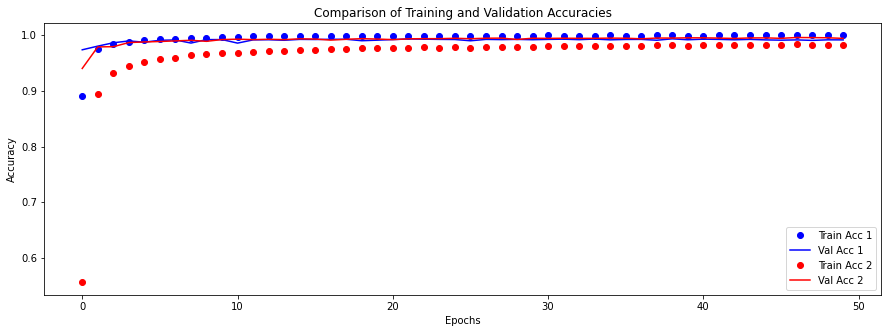

In [22]:
# Compare the accuracies of three training processes
acc1 = history1.history['acc']
val_acc1 = history1.history['val_acc']
acc2 = history2.history['acc']
val_acc2 = history2.history['val_acc']

PlotTwoAccuracyComparison(acc1, val_acc1, acc2, val_acc2, 'Model 1', 'Model 2')

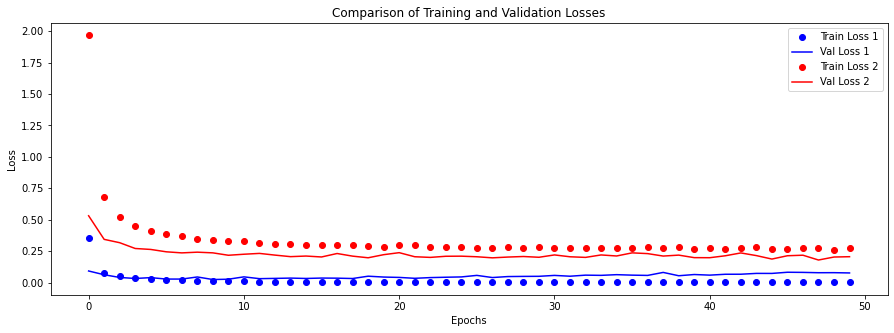

In [23]:
# Compare the losses of three training processes
loss1 = history1.history['loss']
val_loss1 = history1.history['val_loss']
loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

PlotTwoLossComparison(loss1, val_loss1, loss2, val_loss2, 'Model 1', 'Model 2')

In [24]:
LABELS= ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

# Define the confusion matrix for the results
def show_confusion_matrix(validations, predictions, num_classes):
    matrix = metrics.confusion_matrix(validations, predictions)
    plt.figure(figsize=(num_classes, num_classes))
    hm = sns.heatmap(matrix,
                cmap='coolwarm',
                linecolor='white',
                linewidths=1,
                xticklabels=LABELS,
                yticklabels=LABELS,
                annot=True,
                fmt='d')
    plt.yticks(rotation = 0)  # Don't rotate (vertically) the y-axis labels
    #hm.invert_yaxis() # Invert the labels of the y-axis
    hm.set_ylim(0, len(matrix))
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

Validation loss: 0.2053893506526947
Validation accuracy: 0.9944000244140625


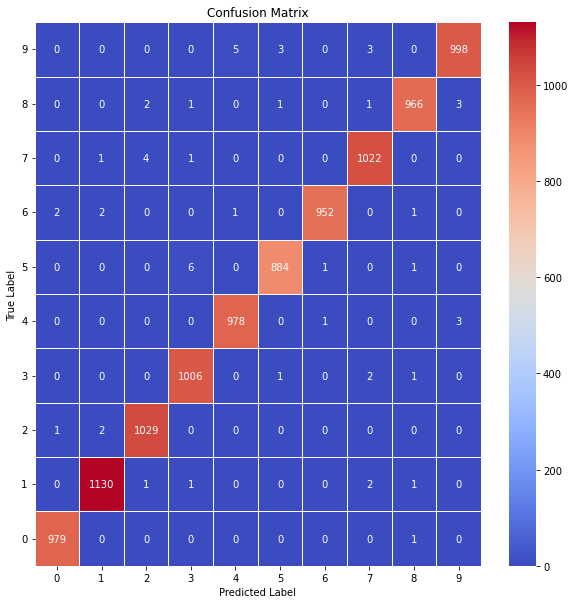

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       980
           1       1.00      1.00      1.00      1135
           2       0.99      1.00      1.00      1032
           3       0.99      1.00      0.99      1010
           4       0.99      1.00      0.99       982
           5       0.99      0.99      0.99       892
           6       1.00      0.99      1.00       958
           7       0.99      0.99      0.99      1028
           8       0.99      0.99      0.99       974
           9       0.99      0.99      0.99      1009

    accuracy                           0.99     10000
   macro avg       0.99      0.99      0.99     10000
weighted avg       0.99      0.99      0.99     10000



In [25]:
# Evaluate the model and print out the final scores for the val set
score = model2.evaluate(x_val, y_val, verbose=0)  # evaluate the model on the val set
print('Validation loss:', score[0])      # print out the loss = score[0] (generalization error) 
print('Validation accuracy:', score[1])  # print out the generalization accuracy = score[1] of the model on val set

# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model2.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

Number of misclassified examples:  56
Misclassified examples:
[ 340  582  625  659  716  726  938 1112 1226 1232 1247 1364 1393 1681
 1737 1878 1901 2035 2130 2182 2293 2462 2597 2654 2771 2939 3073 3384
 3422 3475 3558 3808 4201 4284 4497 4571 4699 4761 4823 4860 5654 5937
 5955 6555 6558 6571 6576 6755 8279 8316 8325 8376 8408 9620 9642 9729]
Misclassified images (original class : predicted class):


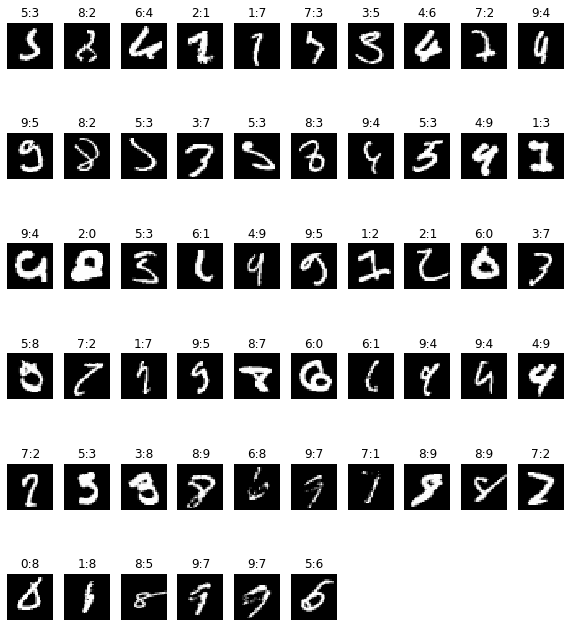

In [26]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]].reshape(img_rows, img_cols)) # index of the val sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

Porównanie wyników wykazało, że nasz drugi model osiąga wyższą dokładność niż model wcześniejszy (prostszy).

Nadal możesz próbować zmieniać hiperparametry modelu i osiągać jeszcze lepsze wyniki!

## <a id='toc1_7_'></a>[Przykład trenowania i walidacji ConvNet na zbiorze danych CIFAR-10](#toc0_)

Przyjrzyjmy się innemu przykładowi splotowej sieci neuronowej użytej do klasyfikacji danych CIFAR-10.

Teraz użyjemy obrazów RGB o wymiarach 32 x 32 pikseli i podzielimy je na 10 klas.

Dane uczące zawierają 50 000 obrazów, a zestaw danych testowych składa się z 10 000 obrazów.

In [27]:
from keras.datasets import cifar10 # gets CIFAR-10 dataset from repository

# Define hyperparameters
num_classes = 10 # number of classes of images

# Input image dimensions
img_rows, img_cols = 32, 32

# Split the data between train and val sets
(x_train, y_train), (x_val, y_val) = cifar10.load_data() # 50000 training and 10000 validating examples

170508288/170498071 [==============================] - 285s 2us/step


<Figure size 180x180 with 0 Axes>

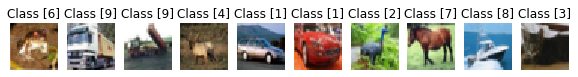

<Figure size 72x72 with 0 Axes>

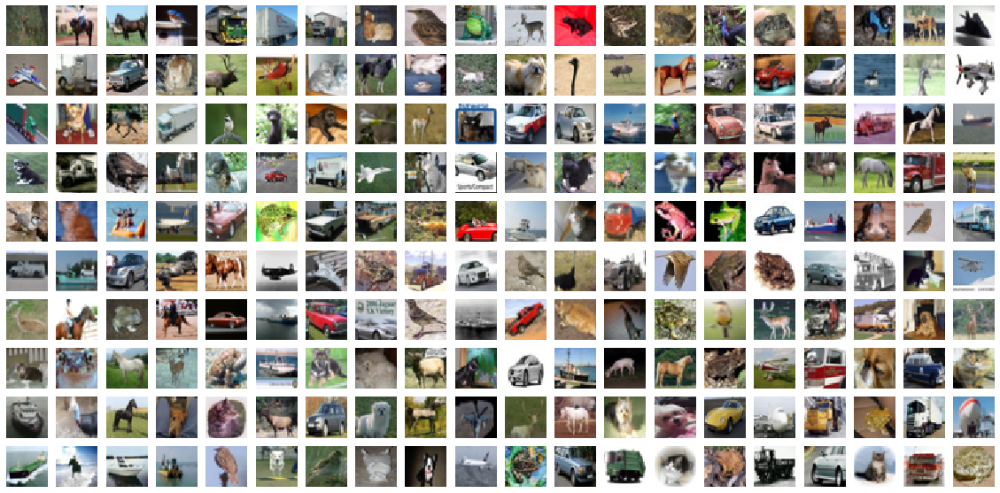

In [28]:
# Show a few sample images from the training set
#plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
plt.figure(figsize=(2.5,2.5))
col1 = 10
row1 = 1
fig = plt.figure(figsize=(col1, row1))
for index in range(0, col1*row1):
    fig.add_subplot(row1, col1, index + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
    plt.title("Class " + str(y_train[index]))
plt.show()
    
# Show a few sample digits from the training set
#plt.rcParams['figure.figsize'] = (1.0, 1.0) # set default size of plots
plt.figure(figsize=(1.0,1.0))
col2 = 20
row2 = 10
fig = plt.figure(figsize=(col2, row2))
for index in range(col1*row1, col1*row1 + col2*row2):
    fig.add_subplot(row2, col2, index - col1*row1 + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
plt.show()

In [29]:
# According to the different formats reshape training and validating data
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 3, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 3, img_rows, img_cols)
    input_shape = (3, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 3)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 3)
    input_shape = (img_rows, img_cols, 3)

# Transform training and validating data and show their shapes
x_train = x_train.astype('float32')   # Copy this array and cast it to a specified type
x_val = x_val.astype('float32')     # Copy this array and cast it to a specified type
x_train /= 255 # Transfrom the training data from the range of 0 and 255 to the range of 0 and 1
x_val /= 255  # Transfrom the validating data from the range of 0 and 255 to the range of 0 and 1
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_val.shape[0], 'validating samples')

# Convert class vectors to binary class matrices
y_train = tensorflow.keras.utils.to_categorical(y_train, num_classes)
y_val = tensorflow.keras.utils.to_categorical(y_val, num_classes)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 validating samples


### <a id='toc1_7_1_'></a>[Utwórz model dla tego zbioru danych](#toc0_)

In [30]:
# Define the sequential Keras model composed of a few layers
model3 = Sequential()   # establishes the type of the network model
# Conv2D - creates a convolutional layer (https://keras.io/layers/convolutional/#conv2d) with 
# filters - specified number of convolutional filters
# kernel_size - defines the frame (sliding window) size where the convolutional filter is implemented
# activation - sets the activation function for this layers, here ReLU
# input_shape - defines the shape of the input matrix (vector), here input_shape = (1, img_rows, img_cols)
model3.add(Conv2D(64, kernel_size=(3, 3),activation='relu', input_shape=input_shape))
model3.add(Conv2D(64, (3, 3), activation='relu'))
# MaxPooling2D pools the max value from the frame (sliding window) of 2 x 2 size
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.25)) # Implements the drop out with the probability of 0.25
model3.add(Conv2D(128, (3, 3), activation='relu',padding='same'))
#model3.add(Conv2D(128, (3, 3), activation='relu',padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.35))
model3.add(Conv2D(256, (3, 3), activation='relu',padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.35))
# Finish the convolutional model and flatten the layer which does not affect the batch size.
model3.add(Flatten())
# Use a dense layer (MLP) consisting of 256 neurons with relu activation functions
model3.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001))) #512
model3.add(Dropout(0.5))
model3.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001))) #256
model3.add(Dropout(0.3))
model3.add(Dense(num_classes, activation='softmax'))

# Now print the full model and notice the number of all trainable paramters
print(model2.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 13, 13, 32)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 6, 6, 64)         

In [31]:
# Define hyperparameters
batch_size = 512 # size of mini-baches
epochs = 50      # how many times all traing examples will be used to train the model

# Compile the model using optimizer
opt = tensorflow.keras.optimizers.Adam(learning_rate=0.001) #, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, name="Adam") # https://keras.io/api/optimizers/adam/
#opt = optimizers.Adadelta(learning_rate=0.001, rho=0.95, epsilon=1e-07, name="Adadelta", **kwargs)  # https://keras.io/api/optimizers/adadelta/
#opt = optimizers.Adagrad(learning_rate=0.001, initial_accumulator_value=0.1, epsilon=1e-07, name="Adagrad", **kwargs)  # https://keras.io/api/optimizers/adagrad/
#opt = optimizers.Adamax(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax", **kwargs)  # https://keras.io/api/optimizers/adamax/
#opt = optimizers.Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam", **kwargs)  # https://keras.io/api/optimizers/Nadam/
#opt = optimizers.Ftrl(learning_rate=0.001, learning_rate_power=-0.5, initial_accumulator_value=0.1, l1_regularization_strength=0.0, l2_regularization_strength=0.0, name="Ftrl", l2_shrinkage_regularization_strength=0.0, beta=0.0, **kwargs)  # https://keras.io/api/optimizers/ftrl/
#opt = optimizers.RMSprop(learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07, centered=False, name="RMSprop", **kwargs) # https://keras.io/api/optimizers/rmsprop/
#opt = optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False, name="SGD", **kwargs)  # https://keras.io/api/optimizers/sgd/
model3.compile(loss=keras.losses.categorical_crossentropy,
               optimizer=opt,
               metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction durint the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
                                            factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
                                            patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
                                            verbose=1,  # 0: quiet, 1: update messages.
                                            min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
          rotation_range=20,       # rotate images in degrees up to the given degrees
          width_shift_range=0.1,   # shift images horizontally
          height_shift_range=0.1,  # shift images vertically
          horizontal_flip=True)    # flip images (left<->right)
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train)

# Train the model, validate, evaluate, and present scores
#history=model3.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
history=model3.fit(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,
                            steps_per_epoch=x_train.shape[0]//batch_size,  # no of mini-batches 
                            validation_data=(x_val, y_val),
                            verbose=1,
                            callbacks=[learning_rate_reduction])

Epoch 1/50
97/97 [==============================] - 140s 1s/step - loss: 2.3999 - acc: 0.2532 - val_loss: 1.8219 - val_acc: 0.4035 - lr: 0.0010
Epoch 2/50
97/97 [==============================] - 130s 1s/step - loss: 1.7860 - acc: 0.3976 - val_loss: 1.5539 - val_acc: 0.4800 - lr: 0.0010
Epoch 3/50
97/97 [==============================] - 130s 1s/step - loss: 1.5969 - acc: 0.4639 - val_loss: 1.3915 - val_acc: 0.5474 - lr: 0.0010
Epoch 4/50
97/97 [==============================] - 138s 1s/step - loss: 1.4768 - acc: 0.5113 - val_loss: 1.3122 - val_acc: 0.5766 - lr: 0.0010
Epoch 5/50
97/97 [==============================] - 142s 1s/step - loss: 1.3926 - acc: 0.5458 - val_loss: 1.2083 - val_acc: 0.6185 - lr: 0.0010
Epoch 6/50
97/97 [==============================] - 142s 1s/step - loss: 1.3285 - acc: 0.5742 - val_loss: 1.1833 - val_acc: 0.6175 - lr: 0.0010
Epoch 7/50
97/97 [==============================] - 143s 1s/step - loss: 1.2690 - acc: 0.5944 - val_loss: 1.1442 - val_acc: 0.6402 - lr:

In [32]:
# Save weights of the model before training to enable to start training it again
model3.save(models_dir + 'CNN_CIFAR-10_1.h5')

Train loss: 0.6845431327819824
Train accuracy: 0.8154399991035461
Bias: 0.8154399991035461
Validation loss: 0.755954921245575
Validation accuracy: 0.7946000099182129
Variance: -0.020839989185333252


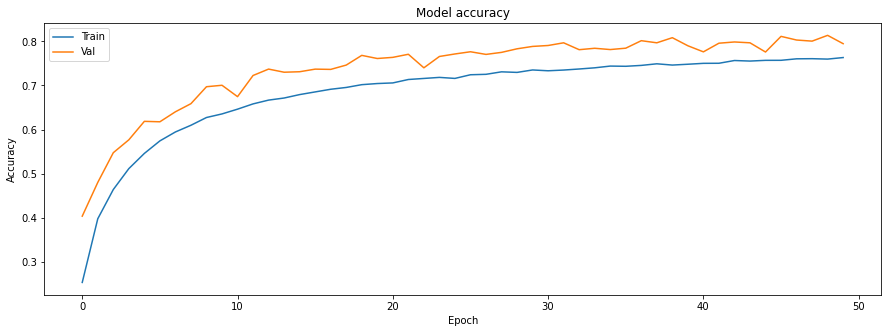

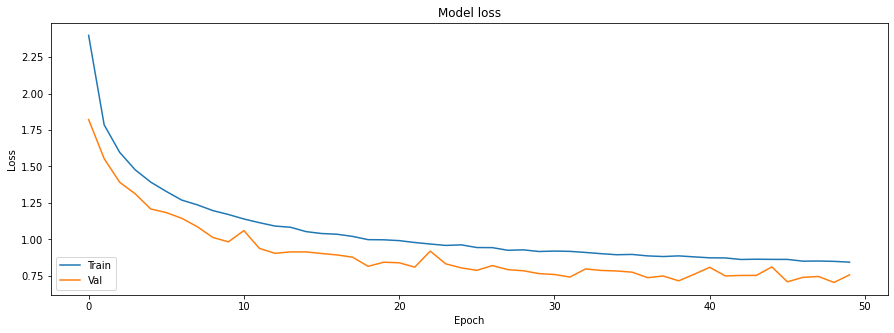

In [33]:
score_train = model3.evaluate(x_train, y_train, verbose=0)
print('Train loss:', score_train[0])
print('Train accuracy:', score_train[1])
print('Bias:', score_train[1])   # Assuming that the Bayes optimal error is equal to 0.

score_val = model3.evaluate(x_val, y_val, verbose=0)
print('Validation loss:', score_val[0])
print('Validation accuracy:', score_val[1])
print('Variance:', score_val[1] - score_train[1])

plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots

# Plot training & validation accuracy values: https://keras.io/visualization/#training-history-visualization
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values: https://keras.io/visualization/#training-history-visualizatio
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='lower left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Jak możemy zauważyć, wariancja jest ujemna (mniejsza niż 0). Czy powinniśmy się z tego cieszyć? Skąd to pochodzi? Tryb mini-batch i mechanizmy regularyzacji takie jak Dropout i regularyzacja wagi L1/L2 są wyłączone na czas walidacji, dzięki czemu model nie ulega adaptacji tak jak w czasie testowania. Dlatego błąd uczenia jest zwykle (zawsze) większy, co może wydawać się dziwne w świetle klasycznych modeli uczenia maszynowego. Z drugiej strony tak obliczona wariancja nie jest prawdziwa. Musielibyśmy ją obliczyć bez włączonych współczynników regularyzacji i na tej samej partii danych, aby wynik był porównywalny z błędem obliczonym dla danych testowych.

Błędy uczenia i walidacji w dalszym ciągu maleją, zatem szkolenie należy kontynuować, aby osiągnąć prawdopodobnie lepsze wyniki, zmniejszając obciążenie (bias) modelu, które po 50 epokach nie jest nadal zadowalające!

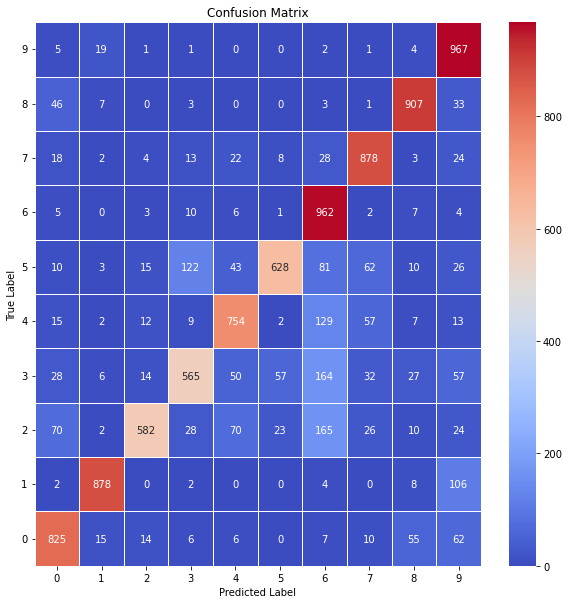

              precision    recall  f1-score   support

           0       0.81      0.82      0.82      1000
           1       0.94      0.88      0.91      1000
           2       0.90      0.58      0.71      1000
           3       0.74      0.56      0.64      1000
           4       0.79      0.75      0.77      1000
           5       0.87      0.63      0.73      1000
           6       0.62      0.96      0.76      1000
           7       0.82      0.88      0.85      1000
           8       0.87      0.91      0.89      1000
           9       0.73      0.97      0.84      1000

    accuracy                           0.79     10000
   macro avg       0.81      0.79      0.79     10000
weighted avg       0.81      0.79      0.79     10000



In [34]:
# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model3.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

Number of misclassified examples:  2054
Misclassified examples:
[   3    9   12 ... 9989 9993 9996]
Misclassified images (original class : predicted class):


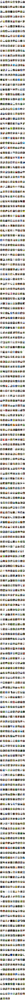

In [35]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]]) # index of the validation sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

Jak widzieliśmy, uczenie tego zbioru danych nie jest tak proste, jak uczenie zbioru MNIST.

Odchylenie modelu jest nadal wysokie, więc model jest niedopasowany. Jednakże wariancja modelu nie wydaje się być zła; jednak nie obliczyliśmy tutaj rzeczywistej wariancji, więc może to wprowadzać w błąd! Co więc musimy teraz zrobić z tym modelem, aby zmniejszyć wysokie odchylenie? Uczmy się tego samego modelu dłużej (przez kolejne sto epok) i zmieńmy rozmiar mini-partii z 512 na 256, aby dać modelowi możliwość nie wpadania tak szybko w lokalne minima lub punkty siodłowe.

Zatem teraz stosujemy __model opieki nad dziećmi__ (__strategia Pandy__), aby poprawić wydajność modelu:

In [ ]:
# Define hyperparameters
batch_size = 256  # size of mini-baches
epochs = 100      # how many times all traing examples will be used to train this model further

# Compile the model using optimizer
model3.compile(loss=keras.losses.categorical_crossentropy,
               optimizer=keras.optimizers.Adadelta(),
               metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction durint the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
                                            factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
                                            patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
                                            verbose=1,  # 0: quiet, 1: update messages.
                                            min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
          rotation_range=20,       # rotate images in degrees up to the given degrees
          width_shift_range=0.1,   # shift images horizontally
          height_shift_range=0.1,  # shift images vertically
          horizontal_flip=True)    # flip images (left<->right)
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train)

# Train the model, validate, evaluate, and present scores
#history=model3.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
history=model3.fit(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,
                            steps_per_epoch=x_train.shape[0]//batch_size,  # no of mini-batches 
                            validation_data=(x_val, y_val),
                            verbose=1,
                            callbacks=[learning_rate_reduction])

In [ ]:
# Save weights of the model before training to enable to start training it again
model3.save(models_dir + 'CNN_CIFAR-10_2.h5')

In [ ]:
score_train = model3.evaluate(x_train, y_train, verbose=0)
print('Train loss:', score_train[0])
print('Train accuracy:', score_train[1])
print('Bias:', score_train[1])   # Assuming that the Bayes optimal error is equal to 0.

score_val = model3.evaluate(x_val, y_val, verbose=0)
print('Validation loss:', score_val[0])
print('Validation accuracy:', score_val[1])
print('Variance:', score_val[1] - score_train[1])

plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots

# Plot training & validation accuracy values: https://keras.io/visualization/#training-history-visualization
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values: https://keras.io/visualization/#training-history-visualizatio
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='lower left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model3.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

In [ ]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]]) # index of the validation sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

Po 100 epokach zwiększyliśmy dokładność modelu z 0,81 do 0,85, dzięki czemu liczba błędnie sklasyfikowanych przykładów walidacyjnych spadła o około kilkaset. Nasz model wciąż nie jest doskonały. Nadszedł czas na Ciebie! Co proponujecie zrobić z tym modelem, żeby działał lepiej od prezentowanego modelu? Zrealizuj swoje pomysły w poniższych zadaniach.

## <a id='toc1_8_'></a>[ZADANIA](#toc0_)

* Skopiuj i wklej opracowany powyżej model do komórek poniżej.
* Modyfikuj hiperparametry modelu (struktura, liczba warstw w sieci i liczba filtrów na warstwę splotu, parametry zaniku itp.) i uzyskaj lepszą dokładność dla obu modeli: MNIST i CIFAR-10.
* Zmniejsz duże obciążenie modelu CIFAR-10, nie zwiększając ani nawet nie zmniejszając wariancji modelu.
* Porównaj dokładność i straty swojego modelu z wcześniej wyszkolonymi modelami (PlotTwoAccuracyComparison i PlotTwoLossComparison).
* Spróbuj przeprowadzić podobne eksperymenty na innym zbiorze danych szkoleniowych obrazów, np. pobrany z <a href="www.kaggle.com">Kaggle.com</a> lub innego źródła. Utwórz nowy model CNN i zaimplementuj regularyzacje oraz inne metody optymalizacji, próbując zmniejszyć obciążenie i wariancję modelu.

* Wyślij opracowany model CNN jako odpowiedź do tego zadania na MS Teams.